In [ ]:
from transfer_matrix import transfer_matrix,generate_animate_input
from animate_transfer import animate_transfer
import anndata as ad

In [1]:
adata1 = ad.read("/DATA/User/zuolulu/01.mouse_embryo/Dorsal_midbrain/E125.h5ad")
adata2 = ad.read("/DATA/User/zuolulu/01.mouse_embryo/Dorsal_midbrain/E145.h5ad")
adata3 = ad.read("/DATA/User/zuolulu/01.mouse_embryo/Dorsal_midbrain/E165.h5ad")

## 修正坐标信息，以便于平铺展示效果
adata1.obsm['spatial'][:, 1] = adata1.obsm['spatial'][:, 1]/2-5000
#adata1.obsm['spatial'][:, 0] = adata1.obsm['spatial'][:, 0] + (adata3.obsm['spatial'][:, 0].max()-adata1.obsm['spatial'][:, 0].max())
#adata2.obsm['spatial'][:, 0] = adata2.obsm['spatial'][:, 0] + (adata3.obsm['spatial'][:, 0].max()-adata2.obsm['spatial'][:, 0].max())

## 获取感兴趣的数据集，作为计算转移矩阵的输入
adata1_sub = adata1[adata1.obs['annotation'].isin(['RGC', 'NeuB', 'GlioB'])]
adata2_sub = adata2[adata2.obs['annotation'].isin(['RGC', 'NeuB', 'GlioB'])]
adata3_sub = adata3[adata3.obs['annotation'].isin(['RGC', 'NeuB', 'GlioB'])]

## 数据保存
# adata1_sub.write("./Dorsal_result_ot/input/E125_sub.h5ad")
# adata2_sub.write("./Dorsal_result_ot/input/E145_sub.h5ad")
# adata3_sub.write("./Dorsal_result_ot/input/E165_sub.h5ad")

In [5]:
## 1. calculate transfer matrix
pi12 = transfer_matrix(adata1_sub,adata2_sub)
pi23 = transfer_matrix(adata2_sub,adata3_sub)

In [6]:
## 2. input data transformation
pi_matrix_coord = generate_animate_input(pi_list=[pi12,pi23],
                                                   adata_list=[adata1_sub,adata2_sub,adata3_sub],
                                                   time ='Time point',
                                                   annotation='annotation')
pi_matrix_coord.to_csv("./test.csv")

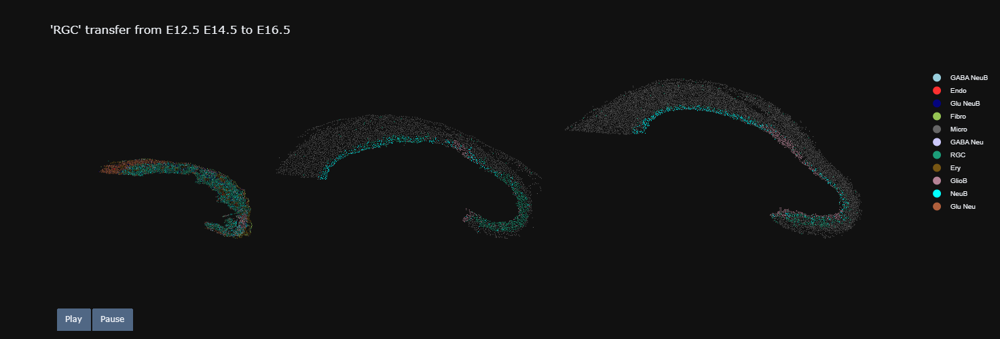

In [10]:
## 3. show animate transfer
animate_transfer(adata_list=[adata1,adata2,adata3],
                 transfer_path='./test.csv',
                 fig_title = " 'RGC' transfer from E12.5 E14.5 to E16.5",
                 time ='Time point',
                 annotation='annotation',
                 save_path='./test.html',
                 times=['E12.5','E14.5','E16.5'])